In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import matplotlib.pyplot as plt
from sklearn.utils import class_weight
from tensorflow.keras.preprocessing import image
import tensorflow as tf
from tensorflow.keras import Sequential
import tensorflow.keras.layers as tfl
from tensorflow.keras.utils import image_dataset_from_directory
from keras.utils.vis_utils import plot_model
import urllib.request
import cv2
import PIL

In [3]:
BATCH_SIZE = 64
IMAGE_SIZE = (48, 48)
train_dir = "../input/fer2013tatv/dataset/train" 
train_aug_dir = "../input/fer2013tatv/dataset/train_augmented"
val_dir = "../input/fer2013tatv/dataset/validation"
test_dir = "../input/fer2013tatv/dataset/test" 

train_dataset = image_dataset_from_directory(train_dir,shuffle=True, color_mode = 'rgb',batch_size=BATCH_SIZE,image_size=IMAGE_SIZE, seed = 42)
train_aug_dataset = image_dataset_from_directory(train_aug_dir,shuffle=True, color_mode = 'rgb',batch_size=BATCH_SIZE,image_size=IMAGE_SIZE, seed = 42)

validation_dataset = image_dataset_from_directory(val_dir,shuffle=True,color_mode = 'rgb', batch_size=BATCH_SIZE,image_size=IMAGE_SIZE, seed = 42)
test_dataset = image_dataset_from_directory(test_dir,shuffle=True,color_mode = 'rgb', batch_size=3589,image_size=IMAGE_SIZE, seed = 42)

Found 28709 files belonging to 7 classes.


2022-03-27 12:08:09.808390: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-27 12:08:09.895312: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-27 12:08:09.896002: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-27 12:08:09.898295: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Found 108711 files belonging to 7 classes.
Found 3589 files belonging to 7 classes.
Found 3589 files belonging to 7 classes.


In [4]:
#checking class names
class_names = train_dataset.class_names
class_names

['0', '1', '2', '3', '4', '5', '6']

In [5]:
# dictionary to map the class into human readable labels
class_mapping = {'0': 'Angry', '1': 'Disgust', '2': 'Fear', '3': 'Happy', '4': 'Sad', '5': 'Surprise', '6' : 'Neutral'}

In [6]:
# mapping of class labels
clas = pd.Series(train_dataset.class_names).map(class_mapping)
clas =  list(clas)
clas

['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

In [7]:
IMAGE_SHAPE = IMAGE_SIZE + (3,)
IMAGE_SHAPE

(48, 48, 3)

# Display random Images from Train dataset

2022-03-27 12:08:33.571475: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


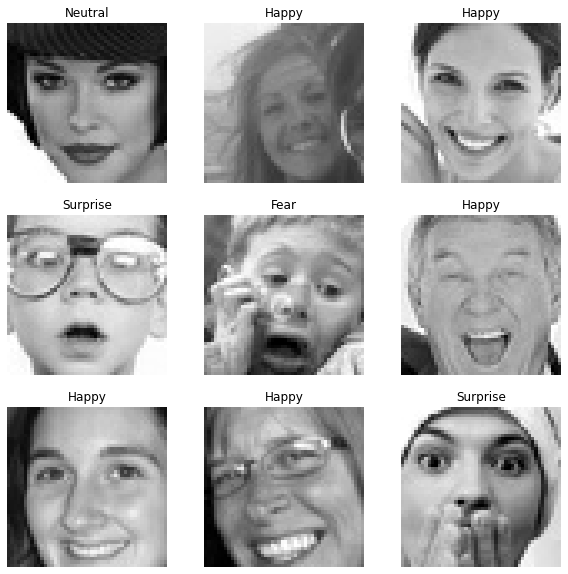

In [8]:
class_label = clas

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_label[labels[i]])
        plt.axis("off")

# Display random images from Train Augmented dataset

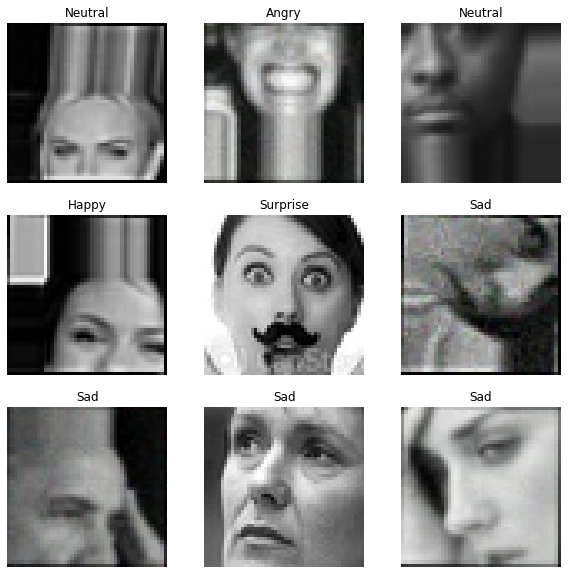

In [9]:
class_label = clas

plt.figure(figsize=(10, 10))
for images, labels in train_aug_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_label[labels[i]])
        plt.axis("off")

# Retriving image from URL

In [10]:
#'https://www.pngall.com/wp-content/uploads/2016/04/Happy-Person-Free-Download-PNG.png'
image_url = 'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxIQEhUQDxAQEA8QDxAQDxAXEA8QEBAVFRUWFxgVFhUYHSggGBslGxUVITEhJSkrLi4uGB8zODMtNygtLisBCgoKDg0OGhAQGy0dHR0tLS0tKystLS0tLSsrLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tNzctLS0tNzcrLf/AABEIALwBDQMBIgACEQEDEQH/xAAcAAEAAQUBAQAAAAAAAAAAAAAABQECAwQGBwj/xAA8EAACAQMCAgcFBgUDBQAAAAAAAQIDBBESIQUxBhNBUWFxkQciMoGhFEJSscHRI3KSk9IVwuEzQ4Kisv/EABgBAQEBAQEAAAAAAAAAAAAAAAABAwIE/8QAHxEBAQACAwEAAwEAAAAAAAAAAAECEQMhMRJBUZET/9oADAMBAAIRAxEAPwD2kAAAAAAAAAAAAABQpkC4ZLGy1yAy5GTA5lusDZyMmtrKqYGxkGFSL0wLwW5KgVAAAAAAAAAAAAAAgEAAAAAAAAAAAAoVLWAZFcd6QW1lDXdVo0192POc/wCWK3ZzPtF6c/YV1FtoldSTc2/eVGONm4rnJ7YR4le3NS5k6leUpze85ylNyey9MdwWR6Rxv2uVJPFhQhGGcdZXaTl/LFPHqznKvtQ4hTmpzrwcH9z7PBw+mH88nE2V1BSaaxjeL05WcY/E8fLJfOdJZUkm1vF6stZ5xafLd5C6evcG9rVGemN1BRzj+LTblD5we6+WTvLLilKvHXRqQqQf3oyUl5PuPlDUk/dTS8+ROdHek9eyqqpSltjE4ZzCou6S/JkNPptVy+NY5Ho50lp31FVqTxvpnBtaoSXYyZhclcpmNQzRmRNKubdOqBvxkXpmtCZmiwMiKlqKoCoAAAAAAAAAABAIAAAAAAAAAAAKMgemnSOHDrWdxPeXwUYds6kvhXkub8ETrPHvb45SlaU1nS1Wlpy8OWYJPHk3uFjz62jX4hWc49ZUr1JSk3l9rw5SfYuXp4HZ2HszclmvX0yeNqceXhqlzJT2acNVGlJyS6yWnO3JdiR3lOJjll29GOPTzin7J7RPLq1384L9C6fsxs0+dV7fiX7HpE4I1aqycXKu5I8wrey+h2Vqi+UTn+Kez2VN5o1VLZ4jJY+p7JWjsQvEKWd+4kzq/wCeNeQdEeO1OHXOiotNKpNU68XtpxnEueFjPPuPaaN34njvTyxWvrF8T2l447Ttei3EestqMs79VGL847foemXceTLHV07uhckjQrHLW1yS9rXK5dDRqG3TkRNvUJClIDciy9GKDMiAuAQAAAAAAAAABAIAAAAAAAAAUZUowLWeYe1uipV7Rvko1c/KUD0+R5n7VauatvGLTko1877rent8yV1j6ydE23FvlFPHm/8Ag6ulLY5DorU0WmvS3mpNxik8vfCRHcRurlturc07bbU45y4LszlqMfmzz316p49Dlua04nmnDuK1YVcU76rXSbi4tUnFtc1s3lo9CpVXKlrfPG65HNdSflZcoiq++e05HjPG6t1VlRoVpUo0/wDqVFtFeb5Ef9irRT6riHXPPvJ7Yfdqi9vmJNxd6uml0xoaljxaz3F/Q2pptoLulU/+2a/GKtV0p9dFxqJx37JeKL+AyxSil4/mzfj8ebm9djaVycs6xydpVJ6xqGjF1NrUJW3mQFlMmbaQEpTZmia1JmxEC9FSiKgAAAAAAAAAgEAAAAAAAAAKMqUYFkzj+kljTq6oVcKc5ydNr4ovGcrwwtzsJELd0sVHKSW/wvuyZ8njbh1uuW6JUpK0pqW0m5N/1Pc3a/CISy+ppSf4pwU5P6GPgFdOCj+Byg/DDZOdYktzDL16MeogbPgFOMsyhS56tMaUYrPfvncl68Pdl5ZMELtvXPlSpp5aTbffjyMVnxm2qLar2POqMoP0lhkk26rjeB8NpxqTk6cXKUp7tyXxZTXpsbtXopRbclQpU23qc1Oq557+zPqaPGOkVChVqKDblhNYjJ5a7O462zu41aUZrbVFPHcTdnS6nrz7pda6ouCf4Pe7fiRGxjGKiqaSp6Voec5XedB0sikpeMWvXY5tUtG3Y5NxXdHkvXDfkzbjY80mqlrSRPWMjnbRk9Ys3eR0tjInLVnP2LJ21AlqLNmBq0TagBkRUoioAAAAAAAAAIBAAAAAAAAACjKlGBZI0L2jr7tu9ZN+Rr1ULNrLp5xazdK4rwzyuKi58k3qTx2bM3+KcSxRlUXKKe3a+z9zT6Vw6i61492vCMvOUMRa9HFkVXv1JSjL4akHpXbJp8l3cu3xPNnj29eGW5tdw3pFGcvs6dWtcP4qVOHuw7MNvC8C/iXBHJKUaN5R+FPT1ck87LbJK2tjKK6+1qRp1ZJddiEJRqvGnV7y2e3YataPE4e/G+lhyTalQt6sY4zjTjS1u+X1LJG0lvkn9cBxTg9OhmtVheLTu5yjjG7X5p+hO9FePSlJU4OVWk8LVpadPzLuJ2vEK8XSr3XXUpuOpO3pwaw21hp+PjsOso2KjCKx1dGpOXP3pe6lkmUlSy493pq9KblNyj3SXpkjZVdcs4wtklz2SwR8bqVRLVnLeqTfyx+Ru0Ea8eOo8nLnupO0RPWKIS0RPWMTRin7FE7akLYonLVASdE2oGtRRswAyIqURUAAAAAAAAAEAgAAAAAAAABRlQwLJGCojYZhqIDl+mPC/tFBqL01ISU6Uu6XLHk08Hkim6b99aZ0NWY753zv5p4PdL6OYvyOG6S9HoXCcl7tTG01+T70ZZ3V7bcc3Gh0X4pJRanLUk1jvknnlhvfZm/xTrJx1Uakocm9W67PDlj8zzecbizm8xejfde9F8916vYlpdL1KmsSaaSTg3smn6rP6nPz+m+OevUzWvnTTdSeWsZwcFx/iUpylFPKmoqKW+3P/gzcR49r2xqk0ksLfy9S3g/DtMuurY6x7xh2Qz2sSfPdTPL76i62snTScvilFN+Hgb9BGa/jtCXemiy3Rrjdx5s5rKxKWaJ+xiQlmjoLFHThOWMSbtURFkiatkBv0kbMTXpGxEC9FSiKgAAAAAAAAAgEAAAAAAAAAKAoAZimXtmObA160MqXhGT+hBuPodNbx7TBd8MUvehhS7ux/sZ8mO2nHnJ64664PCae27OM430PWdUYU3/4tfkel16Li8NNMjb2EtLSSeTzXceyavryqXDXS2hThB9rS39WVtLKWfe7/U7ifDe/57F9rwCVaWmCwk/enjaK/V+Alt6WzHHtzn+mutTqNJ4oUpVM+Oz0/NKRDW57BR4bTo0+qhH3cNSzznnm2ec8U6PVKEpuK10oy5rLcYvdal+p7McdY6eDPP6y2tszoLE52zkTtlMrl0tkyZtmQFnUJi2qAS9NmeLNKlM2ITA2EVMakXJgXgtyVAqAAAAABAIAAAABQAUDZa2BVstcijT8jLCGAMWG+wdV3tZNjBjkslgvjHHIuMcZ45+pkIMVehGaxJZX1Xkzk+IV6MKzoKvSlUjHVKnrjrgny1diz2d5r+1bpr/pluoUd7u492m8ZVKP3py7njKj3vyZ4C4qtmq25Sllycm5Sb7W292yXjmTvHO4+PoK0p0qlRQlVhDLaS1LVNrnGPZnw5nTRoRhHTBKMVyR8mLilWCapVJ04tOL0zlHKfNPDPdvZlx27q28YX0lUyv4VbE9ePw1ZPZy8V8xhxzHxM87l66ystzXsVF1pprlGEZeOU2l6fmbqhlmtwGPWdZVXKdWWl96h7qa+SNWbTv+DW7ljqoZfdHS/VEVd9HnTTnSk3Fc4P4vk+0n6mZ3Eo4bUIRcn3Nt/sSGiOMYz54Fg4m1rYJi2rklU4XRk89Xh9++THHhlPksp+b/AFOfldr6Nc26dYjbi1lT3XvR+pbSuDnSpuNQyxmRVO4NmnWAkFIuTNWFQzRkBmKliZcBUAAAgEAAAFCjKstAqlksnFp/VeJkii6SyvFcio12gk+9mVosZQVRrn2GRPwLJrMc9uC6k8pEVVrJSrcKEJTm8RhGUpPwSyyieHgx3VJSTi0nGSw0+T8wOBs+jz4j1tXiENUbl6oQec04/dS7sJL0PJukfR2pw65naZc4OCqUZvbMWmt9sZTynj9T6RzjG2Meh4t7XLyM+JQhH4qVsozfjJ6kvTHqdxHA9EuDu8rworlr/iPuiv3wfTfC+HwhSVOMUopJJYPBPZXdxo8RdGp/3k4QfdNZkvVZXofQ9q9h+BrV4NRe+/w57cvZPzM9jRjBKEUoxikkltsi6tzMlFYYGlaUv4tST+80vQ2qlPHItmt3Jc09/FGVy96Pc0Qa8moxlN8oxbfyMVOOEm/ia+rNm7p+7p/FOC+WpZ/IactF2NavHeMe5apEdf0UoOeMNcn3+ZK0lqnN9iehfLb88kLxq4Us0ovOn4n49w9Rq0bo3qNwctSucPD7Hgkbe5M3TpqNY26cyCt65JUKoEnCRkTNWnI2IsDIipai4AEAgBRlSjAoy2L3wVkWrK8V9UWDLgqiiafIqkQJIxcnjv3Rl/QsqrZPuf0LAp9qLY7Nr5oyMtqrt7gMdX4l4pmR7ox3H3X4/mXRe4GCLz5pnzZx+7+0cQuK/wCKvNLyj7i+kUfRt5V6tyk+WiU/6VlnzNaLbU/ilht+PadxGhxGUqNWNem9M4yU4vukt0fTPRXisbu3p3EOVWnGWO5tbr5PJ85cWp6oeR6R7B+M6qVS0k96U+sh/LUbb/8AZS9RfR61WXJ+Jel2iSygnsQWx7fExS+JeCMzMM+YGe53Uf5s+kWKawnLuTwYLqp/EpQXaqkn5KOP9yNqphRWdllei3/QgjruX2eg/vTxvjnKT7vNshqFnjEebSzUfPM3vLcl+JzbcY9raqNd3ZFev5Mw1qeiG3N834nUR53ezcKs01j35NeKbNq1uDN0wt1CnTqPaUqkkvFY3+qRC2lY4s1XUdbaVyYtqpy1lVJ2zqEE/QmblNkZbTN+kwNlFyLIl6AqEAgBTBUAWOJdFYKgA0ufb3lykWgBkY2wAAXIAAYqlNtYXY1gqosyAuxG8asp1aco08a3TqRWXhZlFr9TyWn7Kr9LGbX+9P8AwPbAWZWJp4lV9lV+1jNr/dn/AIEh7PvZ1f8AD7vr6rtuqcJRkoVZylzTWzgj10C5U0xRpsOmzKCbVg6p+BZ9neew2gNjTdq3WVV40xozhHffMpRb+kUZq1HU1n4YrKXe/EzAbGgrOTlqljLeXv29i8kilxZSm1nCivHckAX6qacX0w6L17vR1XVrq21FSm0tLW/Jc8pEJQ6B3kebof3Jf4np4ObVcHbdErmPN0v63+xK23Aq0ebh/U/2OnAETR4fNc9PqblOg13G0ALIxLsFQACBUD//2Q=='

#'https://futurereadytalent.in/images/banner/1.png'
image_name = 'test1.jpg'
urllib.request.urlretrieve(image_url, image_name)

# Uncomment if Image is High Resolution
#image = tf.keras.preprocessing.image.load_img(image_name,target_size = (400,400))
#image.save('test1.jpg')
#image_name = 'test1.jpg'

('test1.jpg', <email.message.Message at 0x7f01b4775d50>)

In [11]:
image_name = '../input/test-images/people.jpg'
#image_name = '../input/test-images/anurag anand.jpg'
image = tf.keras.preprocessing.image.load_img(image_name,target_size = (400,400))
image.save('test1.jpg')
image_name = 'test1.jpg'

# Calling Model to detect the faces and predict

In [12]:
# Get size of original image
image_to_avatar = PIL.Image.open(image_name)
img_size_w, img_size_h = image_to_avatar.size
img_size_w, img_size_h

(400, 400)

In [13]:

def emojify(pred):
    if pred == 'Angry':
        img_path = '../input/test-images/angry.jpg'
    elif pred == 'Disgust':
        img_path = '../input/test-images/disgust.jpg'
    elif pred == 'Fear':
        img_path = '../input/test-images/fear.jpg'
    elif pred == 'Happy':
        img_path = '../input/test-images/happy.jpg'
    elif pred == 'Sad':
        img_path = '../input/test-images/sad.jpg'
    elif pred == 'Surprise':
        img_path = '../input/test-images/surprised.jpg'
    elif pred == 'Neutral':
        img_path = '../input/test-images/ANeutral.jpg'
    return img_path

In [14]:
def map_emoji(emoji):
    count = 0
    plt.figure(figsize=(20, 20))
    for i in emoji:
        count += 1
        image = tf.keras.preprocessing.image.load_img(i)
        plt.subplot(1,15,count)
        plt.imshow(image)
        plt.axis("off")

In [15]:
def call_detect(model_name, file_name):
    emoji_address = []
    frame = cv2.imread(file_name)
    gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    faceCascade = cv2.CascadeClassifier('../input/haarcascade-frontalface/haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(gray, 1.24,minNeighbors=3)
    emotion_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6 : 'Neutral'}
    for x, y, w, h in faces:
        roi_gray = gray[y:y+h, x:x+w]
        #roi_color = frame[y:y+h, x:x+w]
        c1, c2, c3 = map(int, np.random.randint(100, 255, 3))
        cv2.rectangle(frame, (x,y), (x+w, y+h), (c1, c2,c3),4)
        faces = faceCascade.detectMultiScale(roi_gray)
        for(ex, ey, ew, eh) in faces:
            face_roi = roi_gray[ey: ey+eh, ex : ex+ew]
            filename= 'te.jpg'
            cv2.imwrite(filename, face_roi)
            image = tf.keras.utils.load_img(filename, color_mode='rgb', target_size=(48,48))
            input_arr = tf.keras.preprocessing.image.img_to_array(image)
            input_arr = np.array([input_arr])
            predictions = model_name.predict(input_arr)
            maxindex = predictions.argmax()
            strtodraw = emotion_dict[maxindex] + str(round(predictions[0][maxindex]*100,0))
            cv2.putText(frame,strtodraw , (x, y-10), cv2.FONT_HERSHEY_COMPLEX, 0.6, (c1, c2, c3), 2, 1)
            resized_img = cv2.resize(frame, (400, 400))  
            cv2.imwrite('u.jpg', resized_img)
            emoji_address.append(emojify(emotion_dict[maxindex]))


    image = tf.keras.preprocessing.image.load_img('u.jpg')
    #input_arr = tf.keras.preprocessing.image.img_to_array(image)
    plt.figure(figsize = (20,12))
    return plt.imshow(image), emoji_address
    

# Loading pre-trained VGG19 model

In [16]:
VGG19_model = tf.keras.models.load_model('../input/emotion-models/Emotion Models/Emotion Models/VGG19_max_val.h5')
VGG19_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 48, 48, 3)         0         
_________________________________________________________________
vgg19 (Functional)           (None, 1, 1, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 1024)              525312    
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               1

2022-03-27 12:08:43.599674: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


AxesImage(180,108;1116x652.32)
CPU times: user 1.42 s, sys: 792 ms, total: 2.21 s
Wall time: 6.55 s


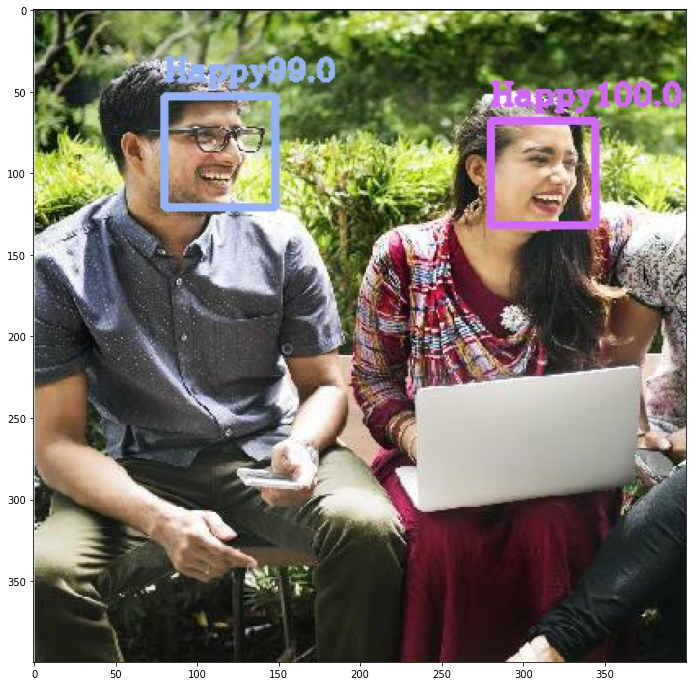

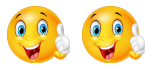

In [17]:
%%time
detected_image, emoji = call_detect(VGG19_model, image_name)
print(detected_image)
map_emoji(emoji)     

# Loading pre-trained ResNet50 model

In [18]:
ResNet50_model = tf.keras.models.load_model('../input/emotion-models/Emotion Models/Emotion Models/ResNet50_max_val.h5')
ResNet50_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 48, 48, 3)         0         
_________________________________________________________________
resnet50 (Functional)        (None, 2, 2, 2048)        23587712  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              8389632   
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_3 (Dense)              (None, 7)                 1

AxesImage(180,108;1116x652.32)
CPU times: user 1.12 s, sys: 0 ns, total: 1.12 s
Wall time: 1.09 s


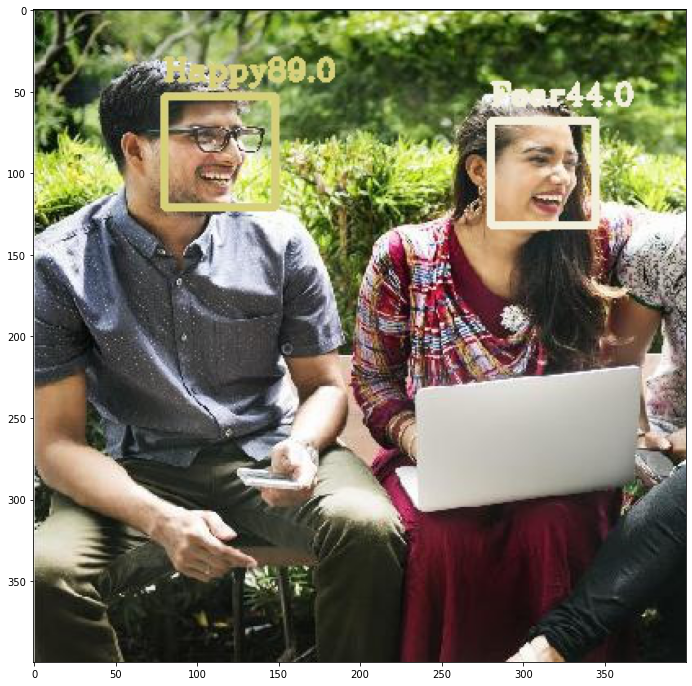

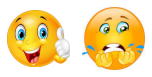

In [19]:
%%time
detected_image, emoji = call_detect(ResNet50_model,image_name)
print(detected_image)
map_emoji(emoji) 

# Loading pre-trained MobileNetV2 model

In [20]:
MobileNetV2_model = tf.keras.models.load_model('../input/emotion-models/MobileNetV2_max_val.h5')
MobileNetV2_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 48, 48, 3)         0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 2, 2, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 5120)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              5243904   
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 7)                 3

AxesImage(180,108;1116x652.32)
CPU times: user 1.12 s, sys: 0 ns, total: 1.12 s
Wall time: 1.1 s


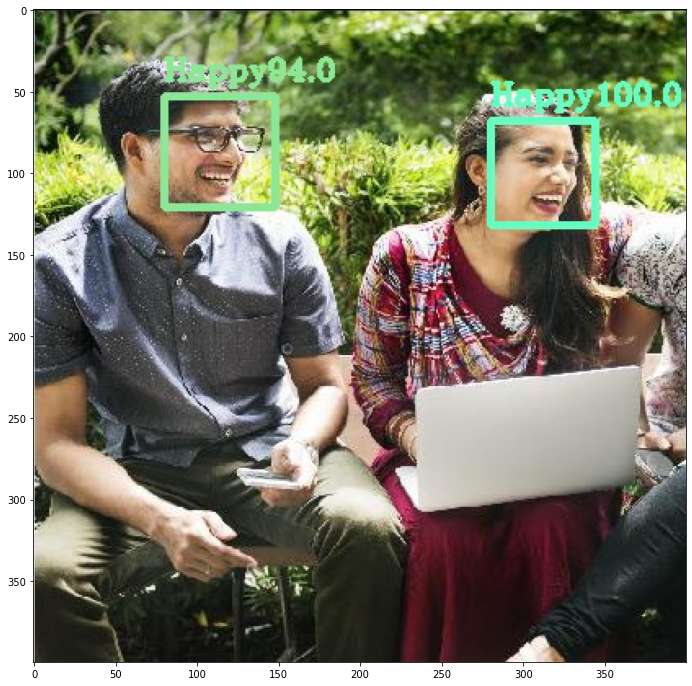

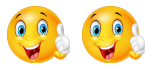

In [21]:
%%time
detected_image, emoji = call_detect(MobileNetV2_model,image_name)
print(detected_image)
map_emoji(emoji) 

# Loading pre-trained DenseNet201 model

In [22]:
DenseNet201_model = tf.keras.models.load_model('../input/emotion-models/Emotion Models/Emotion Models/DenseNet201_max_val.h5')
DenseNet201_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 48, 48, 3)         0         
_________________________________________________________________
densenet201 (Functional)     (None, 1, 1, 1920)        18321984  
_________________________________________________________________
flatten (Flatten)            (None, 1920)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               983552    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0

AxesImage(180,108;1116x652.32)
CPU times: user 3.25 s, sys: 0 ns, total: 3.25 s
Wall time: 3.19 s


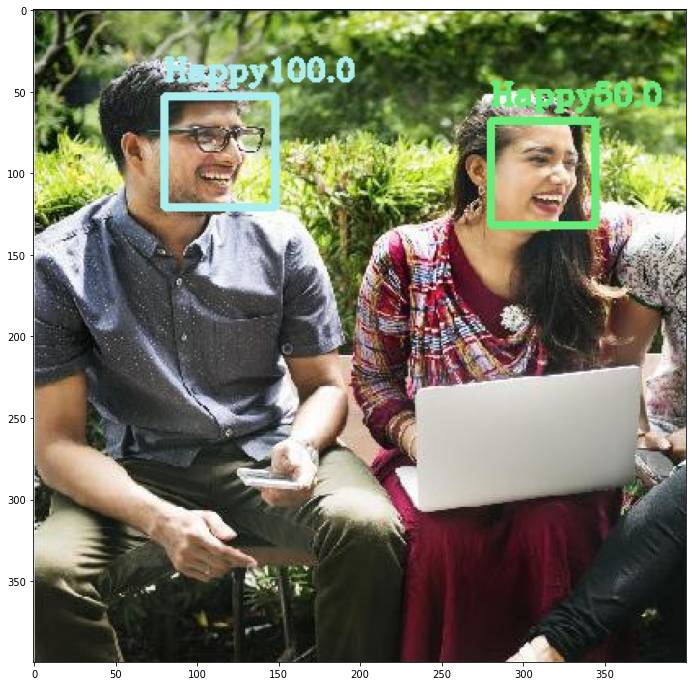

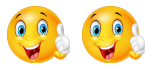

In [23]:
%%time
detected_image, emoji = call_detect(DenseNet201_model, image_name)
print(detected_image)
map_emoji(emoji) 

# Image Avatar generation

(1, 400, 400, 3)


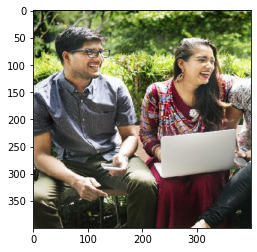

In [24]:
# visualize content images
img_size_w, img_size_h = 400,400
content_image = np.array(PIL.Image.open(image_name).resize((img_size_h, img_size_w)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))
print(content_image.shape)

plt.imshow(content_image[0])

In [25]:
# load the pre-trained model
vgg = tf.keras.applications.VGG19(include_top = False, input_shape = (img_size_w, img_size_h, 3), weights = '../input/emotion-models/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
vgg.trainable = False
print(vgg)

In [26]:
# compute the conent cost for pixels to optimize
def compute_content_cost(content_output, generated_output):
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    a_C_unrolled = tf.reshape(a_C, shape = [m, n_H*n_W, n_C])
    a_G_unrolled = tf.reshape(a_G, shape = [m, n_H*n_W, n_C])
    
    J_content = (1/(4*n_H*n_W*n_C))*tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))
    
    return J_content

In [27]:
# gram matrix to find image correlation
def gram_matrix(A):
    GA = tf.matmul(A, tf.transpose(A))
    
    return GA

In [28]:
# compute style cost at each layer of its activation
def compute_layer_style_cost(a_S, a_G):
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    # reshape the image from(n_H*n_W, n_C) to (n_C, n_H*n_W)
    
    a_S = tf.transpose(tf.reshape(a_S, shape = [-1, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape = [-1, n_C]))
    
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)
    
    J_style_layer = tf.reduce_sum(tf.square(GS - GG))/(4*((n_H * n_W * n_C)**2))
    
    return J_style_layer

In [29]:
# output layer which produces the styled images
vgg.get_layer('block5_conv4').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

In [30]:
# layers on which Style cost optimization is going to performed
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)
]

In [31]:
# function to compute style cost for all layers
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS = STYLE_LAYERS):
    J_style = 0
    
    a_S = style_image_output[:-1]
    
    a_G = generated_image_output[:-1]
    
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])
        
        J_style += weight[1] * J_style_layer
        
    return J_style

In [32]:
# computing total cost 
@tf.function()
def total_cost(J_content, J_style, alpha = 1, beta = 4):
    J = alpha * J_content + beta*J_style
    
    return J

(1, 400, 400, 3)


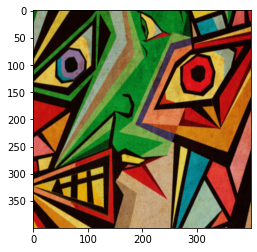

In [33]:
# visualizing style image
style_path = '../input/test-image/download.png'
#style_path = '../input/test-images/stone_style.jpg'
#style_path = '../input/test-images/colorgamaut.jpg'
style_image = np.array(PIL.Image.open(style_path).resize((img_size_h, img_size_w)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))
print(style_image.shape)
plt.imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


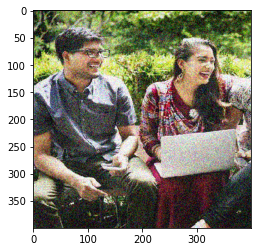

In [34]:
#generating random images of content with noise
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min = 0.0, clip_value_max = 1.0)

print(generated_image.shape)
plt.imshow(generated_image.numpy()[0])
plt.show()


In [35]:
# defining model input and its otuput
def get_layer_outputs(vgg, layer_names):
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]
    
    model = tf.keras.Model([vgg.input], outputs)
    return model

In [36]:
vgg.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 400, 400, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 400, 400, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 200, 200, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 200, 200, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 200, 200, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 100, 100, 128)     0     

In [37]:
content_layer = [('block5_conv4',0.2)]
vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [38]:
#content_target = vgg_model_outputs(content_image)
#style_targets = vgg_model_outputs(style_image)

In [39]:
preprocessed_content = tf.Variable(tf.image.convert_image_dtype(content_image,tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [40]:
preprocessed_style = tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S  = vgg_model_outputs(preprocessed_style)

In [41]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min = 0.0, clip_value_max = 1.0)


In [42]:
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype = np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    
    return PIL.Image.fromarray(tensor)

In [43]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.01)
@tf.function()
def train_step(generated_image, alpha = 10, beta = 40):
    with tf.GradientTape() as tape:
        a_G = vgg_model_outputs(generated_image)
        
        J_style = compute_style_cost(a_S, a_G)
        
        J_content = compute_content_cost(a_C, a_G)
        
        J = total_cost(J_content, J_style, alpha = alpha, beta = beta)
        
    grad = tape.gradient(J, generated_image)
    
    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    
    return J

In [44]:
generated_image = tf.Variable(generated_image)

Epoch 0 


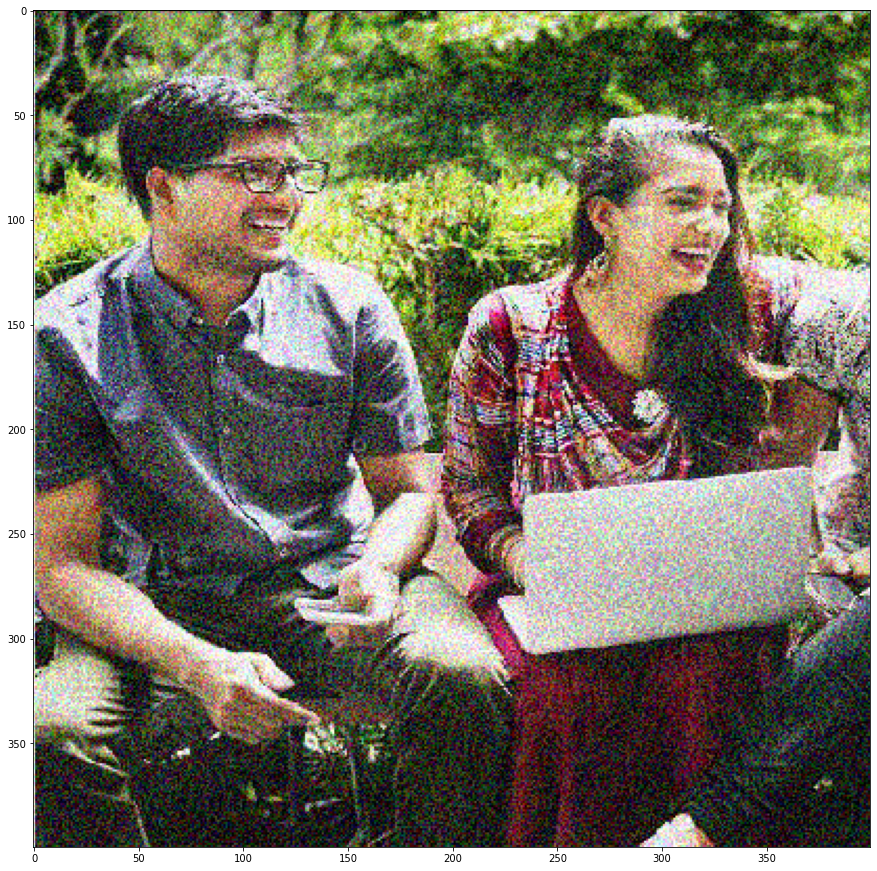

Epoch 5 


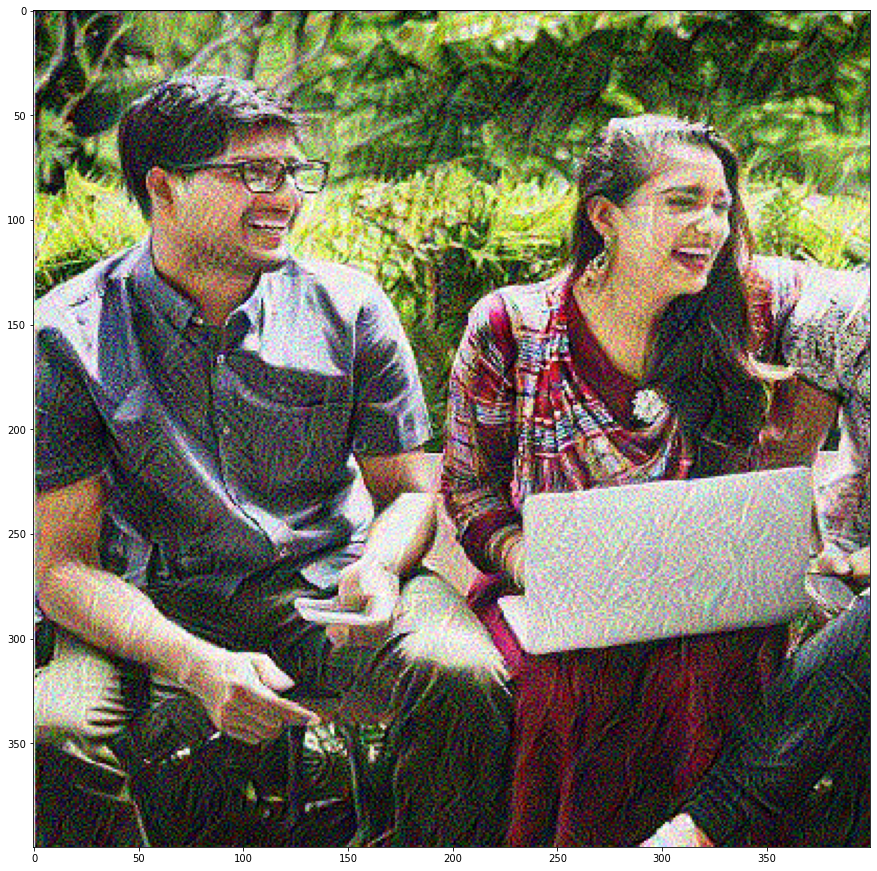

Epoch 10 


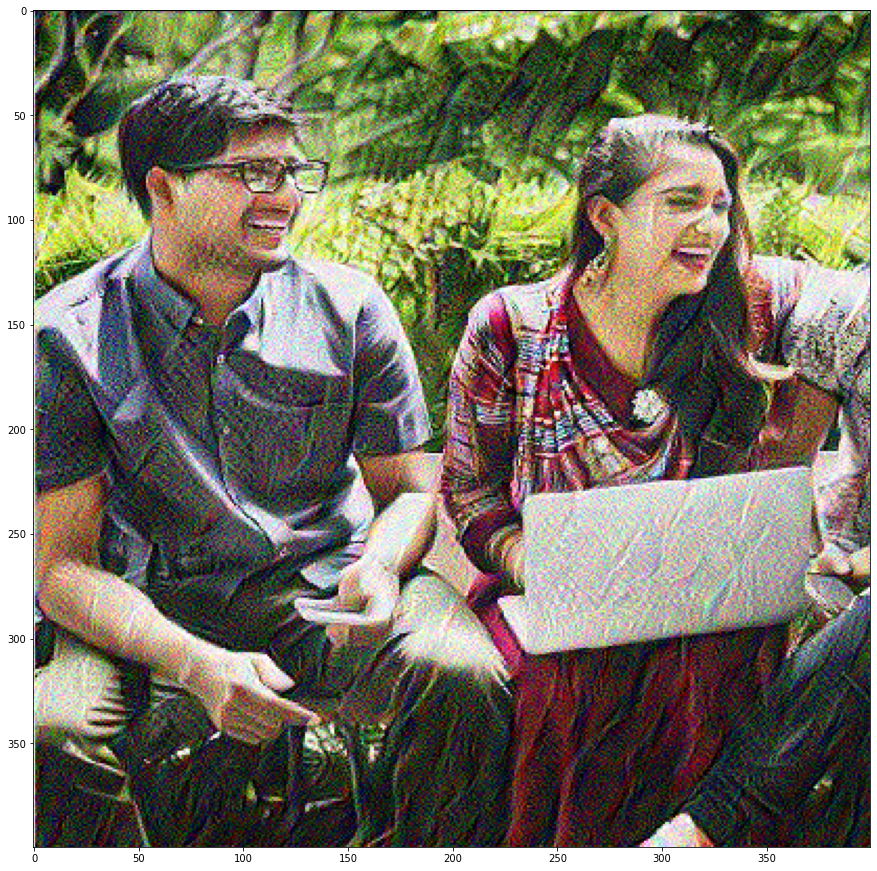

Epoch 15 


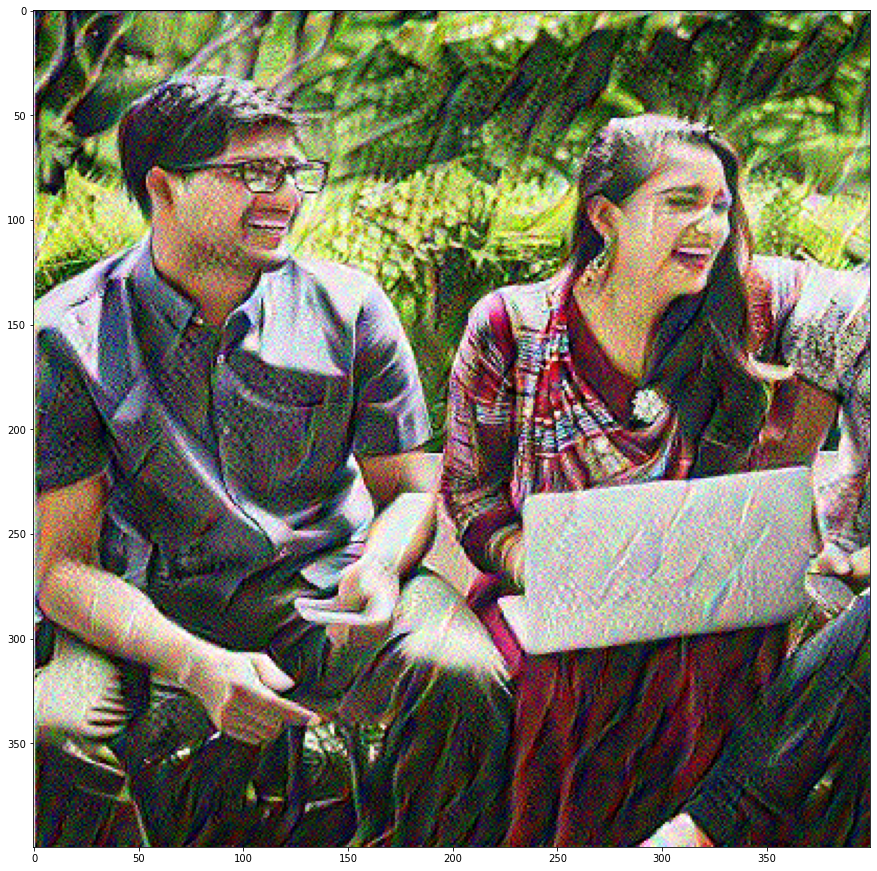

CPU times: user 5.25 s, sys: 330 ms, total: 5.58 s
Wall time: 5.4 s


In [45]:
%%time
epochs = 20
for i in range(epochs):
    train_step(generated_image)
    if i % 5 == 0:
        print(f"Epoch {i} ")
    if i % 5 == 0:
        image = tensor_to_image(generated_image)
        plt.figure(figsize = (15, 20))
        plt.imshow(image)
        plt.show() 